In [40]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))


<h1>Import necessary libraries for the project</h1>

In [41]:

import matplotlib.pyplot as plt # for plotting images
import tensorflow as tf # for building deep learning models
import seaborn as sns # for visualizing data
import random # for generating random numbers
from PIL import Image # for opening and manipulating images
from tensorflow.keras.preprocessing import image # for preprocessing images
from tensorflow.keras.applications.inception_v3 import InceptionV3 # for using pre-trained InceptionV3 model
from tensorflow.keras import Sequential, Model # for building sequential and functional models
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten,
Dropout, Input,GlobalAveragePooling2D,BatchNormalization) # for adding different layers to the models
from tensorflow.keras.activations import softmax # for applying softmax activation function to the output layer
from tensorflow.keras.optimizers import Adam # for using Adam optimizer
from keras.preprocessing.image import ImageDataGenerator # for data augmentation and preprocessing
from mpl_toolkits.axes_grid1 import ImageGrid # for plotting images in a grid
from keras.models import Model # for building functional models
from keras.applications.vgg16 import VGG16, preprocess_input # for using pre-trained VGG16 model and preprocessing input data
from keras.callbacks import ModelCheckpoint, EarlyStopping # for saving model weights and early stopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix,
accuracy_score) # for computing and displaying confusion matrix and accuracy score
import cv2 # for image processing and computer vision tasks

In [42]:
import warnings # supress warnings
warnings.filterwarnings('ignore')

In [43]:
# Create a list of folder names to be used later for loading images

our_folders = ['Acne and Rosacea Photos', \
              'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', \
              'Melanoma Skin Cancer Nevi and Moles', \
              'Vasculitis Photos', \
              'Hair Loss Photos Alopecia and other Hair Diseases'
              ]

In [44]:
root_dir =  r'C:\Users\azizo\Desktop\a\train'

In [45]:
test_dir = r'C:\Users\azizo\Desktop\a\test'

In [46]:
acne_train_path = os.path.join(root_dir,'Acne and Rosacea Photos')
actinic_train_path = os.path.join(root_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_train_path = os.path.join(root_dir, 'Melanoma Skin Cancer Nevi and Moles')
vasculitis_train_path = os.path.join(root_dir, 'Vasculitis Photos')
Hair_train_path = os.path.join(root_dir, 'Hair Loss Photos Alopecia and other Hair Diseases')

In [47]:
acne_test_path = os.path.join(test_dir,'Acne and Rosacea Photos')
actinic_test_path = os.path.join(test_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_test_path = os.path.join(test_dir, 'Melanoma Skin Cancer Nevi and Moles')
vasculitis_test_path = os.path.join(test_dir, 'Vasculitis Photos')
Hair_test_path = os.path.join(test_dir, 'Hair Loss Photos Alopecia and other Hair Diseases')



actinic_test_files = ([files_ for _, _, files_ in os.walk(actinic_test_path)])[0]
acne_test_files = ([files_ for _, _, files_ in os.walk(acne_test_path)])[0]
melonama_test_files = ([files_ for _, _, files_ in os.walk(melonama_test_path)])[0]
vasculitis_test_files = ([files_ for _, _, files_ in os.walk(vasculitis_test_path)])[0]
Hair_test_files = ([files_ for _, _, files_ in os.walk(Hair_test_path)])[0]

In [48]:
train_dirs = [] # create an empty list to store the directory paths of training images

# loop over the list of folder names
for i in our_folders:
    
    # loop over the directories and their subdirectories in the folder
    for folder_,_, files_ in os.walk(f'input/train/{i}'):
        
        print(folder_) # print the directory path
        train_dirs.append(folder_) # add the directory path to the list

In [49]:
#Get all image files in each train directory
actinic_train_files = ([files_ for _, _, files_ in os.walk(actinic_train_path)])[0]
acne_train_files = ([files_ for _, _, files_ in os.walk(acne_train_path)])[0]
melonama_train_files = ([files_ for _, _, files_ in os.walk(melonama_train_path)])[0]
vasculitis_train_files = ([files_ for _, _, files_ in os.walk(vasculitis_train_path)])[0]
Hair_train_files = ([files_ for _, _, files_ in os.walk(Hair_train_path)])[0]

In [50]:
# Define a function for plotting a grid of images for a given folder and its files
def plotGridImages(d_name, list_files, train_path, nrows=1, ncols=5):
    # Create a figure with subplots arranged in a grid
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    # Print the name of the folder for which the images are being displayed
    print(f"{d_name}")
    # Loop over a random sample of files from the folder
    for i, img_id in enumerate(random.sample(list_files, ncols)):
        # Get the image and its path
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        # Show the image in the subplot
        ax.imshow(img / 255.)
        # Add text to the subplot indicating the label of the image
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w', alpha=0.8)
        ax.axis('off')
    # Display the grid of images
    plt.show()

Actinic


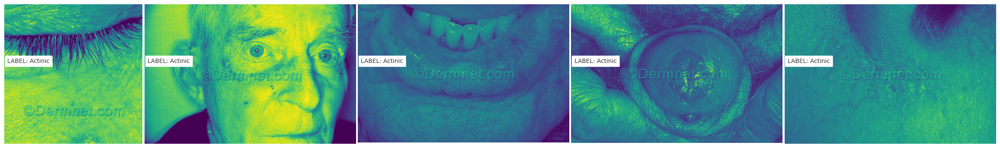

In [51]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=5)

Acne


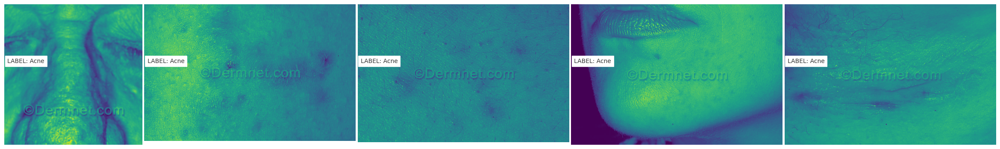

In [52]:
plotGridImages('Acne',acne_train_files, acne_train_path,ncols=5)

Melonama


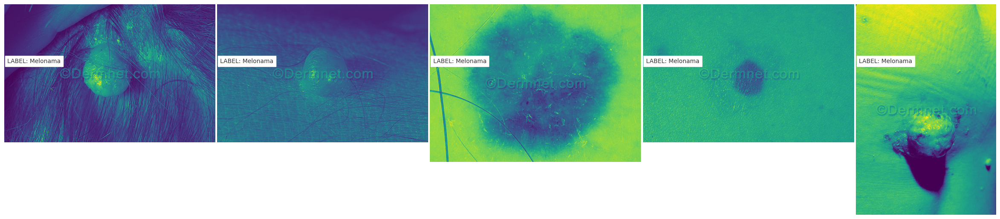

In [53]:
plotGridImages('Melonama',melonama_train_files, melonama_train_path,ncols=5)

In [54]:
plotGridImages('Vasculitis',vasculitis_train_files, vasculitis_train_path,ncols=5)

Vasculitis


Hair


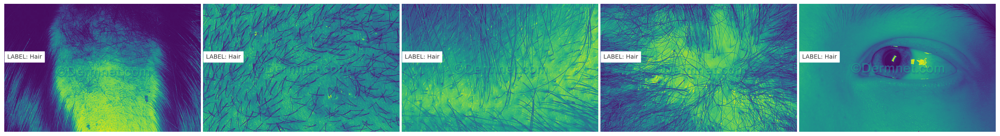

In [55]:
plotGridImages('Hair',Hair_train_files, Hair_train_path,ncols=5)

# DataFrame Creation 

In [56]:
final_df = pd.DataFrame()

In [57]:
actinic_df = pd.DataFrame()
actinic_df['Image'] =  [actinic_train_path+'/'+img for img in actinic_train_files]
actinic_df['Label'] = "actinic"

In [58]:
actinic_df.shape

(1149, 2)

In [59]:
melonama_df = pd.DataFrame()
melonama_df['Image'] = [melonama_train_path+'/'+img for img in melonama_train_files]
melonama_df['Label'] = "melonama"

In [60]:
melonama_df.shape

(463, 2)

In [61]:
acne_df = pd.DataFrame()
acne_df['Image'] =  [acne_train_path+'/'+img for img in acne_train_files]
acne_df['Label'] = "acne"

In [62]:
acne_df.shape

(840, 2)

In [63]:
vasculitis_df = pd.DataFrame()
vasculitis_df['Image'] =  [vasculitis_train_path+'/'+img for img in vasculitis_train_files]
vasculitis_df['Label'] = "vasculitis"

In [64]:
vasculitis_df.shape

(416, 2)

In [65]:
HairLoss_df = pd.DataFrame()
HairLoss_df['Image'] =  [Hair_train_path+'/'+img for img in Hair_train_files]
HairLoss_df['Label'] = "HairLoss"

In [66]:
HairLoss_df.shape

(239, 2)

In [67]:
final_df = pd.concat([actinic_df, melonama_df, acne_df, vasculitis_df, HairLoss_df], ignore_index=True)


In [68]:
final_df = pd.DataFrame(final_df)


In [69]:

#final_df = final_df.append([actinic_df, melonama_df, acne_df, vasculitis_df, HairLoss_df], ignore_index=True)


In [70]:
final_df.shape

(3107, 2)

In [71]:
final_df.head(3)

,Image,Label
0,C:\Users\azizo\Desktop\a\train\Actinic Keratos...,actinic
1,C:\Users\azizo\Desktop\a\train\Actinic Keratos...,actinic
2,C:\Users\azizo\Desktop\a\train\Actinic Keratos...,actinic


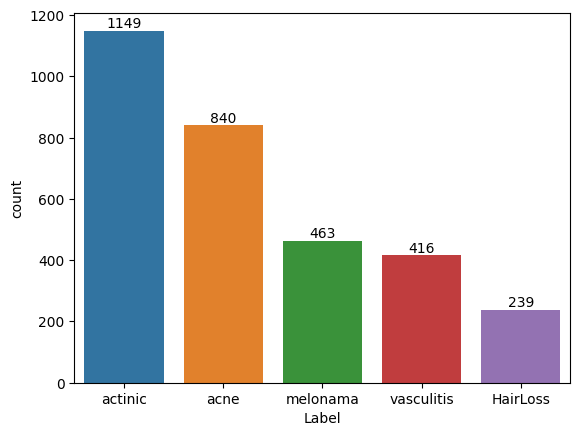

In [72]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [73]:
final_test_df = pd.DataFrame()
################# melonama #########

melonama_test_df = pd.DataFrame()
melonama_test_df['Image'] = [melonama_test_path+'/'+img for img in melonama_test_files]
melonama_test_df['Label'] = "melonama"

##################  actinic  ##########

actinic_test_df = pd.DataFrame()
actinic_test_df['Image'] =  [actinic_test_path+'/'+img for img in actinic_test_files]
actinic_test_df['Label'] = "actinic"

################  acne  ##########

acne_test_df = pd.DataFrame()
acne_test_df['Image'] =  [acne_test_path+'/'+img for img in acne_test_files]
acne_test_df['Label'] = "acne"

###########################################

vasculitis_test_df = pd.DataFrame()
vasculitis_test_df['Image'] =  [vasculitis_test_path+'/'+img for img in vasculitis_test_files]
vasculitis_test_df['Label'] = "vasculitis"

###########################################

HairLoss_test_df = pd.DataFrame()
HairLoss_test_df['Image'] =  [Hair_test_path+'/'+img for img in Hair_test_files]
HairLoss_test_df['Label'] = "HairLoss"

###########################################
print(type(final_test_df))

final_test_df = pd.concat([final_test_df, actinic_test_df, melonama_test_df, acne_test_df, vasculitis_test_df, HairLoss_test_df], ignore_index=True)


final_test_df.shape

<class 'pandas.core.frame.DataFrame'>


(881, 2)

In [75]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)

In [76]:
# Define the batch size
batch_size = 64

# Create a training data generator
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,        # The DataFrame containing the training data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=batch_size,     # The batch size
    class_mode="categorical",  # The type of classification (categorical or sparse)
    subset='training',         # The subset of the data to use (training or validation)
    shuffle=True,              # Whether to shuffle the data
    seed=42                    # The seed for the random number generator
)

# Create a validation data generator
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,        # The DataFrame containing the validation data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=batch_size,     # The batch size
    class_mode="categorical",  # The type of classification (categorical or sparse)
    subset='validation',       # The subset of the data to use (training or validation)
    shuffle=True,              # Whether to shuffle the data
    seed=42                    # The seed for the random number generator
)

# Create a test data generator
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,   # The DataFrame containing the test data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=1,              # The batch size
    class_mode='categorical',  # The type of classification (categorical or sparse)
    shuffle=False,             # Whether to shuffle the data
)

Found 2486 validated image filenames belonging to 5 classes.
Found 621 validated image filenames belonging to 5 classes.
Found 881 validated image filenames belonging to 5 classes.


In [77]:
""""# Importing Xception model from Keras applications
from tensorflow.keras.applications import Xception

# Load the Xception model trained on ImageNet dataset and exclude the last (top) layers
res = Xception(weights ='imagenet', include_top = False, input_shape = (224, 224, 3)) 

# Set the trainable parameter to False to freeze the weights of the loaded layers
res.trainable = False

# Creating new layers on top of the loaded model
x = res.output  # Output from the loaded Xception model is used as input to the new layers
x = GlobalAveragePooling2D()(x)  # Global Average Pooling layer reduces the dimensions of the input
x = BatchNormalization()(x)  # Batch Normalization layer normalizes the inputs to speed up training
x = Dropout(0.5)(x)  # Dropout layer randomly drops a fraction of the input units to prevent overfitting
x = Dense(512, activation ='relu')(x)  # Fully connected Dense layer with 512 output units and ReLU activation
x = BatchNormalization()(x)
x = Dropout(0.5)(x) 
x = Dense(512, activation ='relu')(x)  # Fully connected Dense layer with 256 output units and ReLU activation
x = BatchNormalization()(x)
x = Dense(5, activation ='softmax')(x)  # Final fully connected Dense layer with 5 output units and Softmax activation for classification

# Creating a Keras model by specifying the input and output layers
model = Model(res.input, x)

# Compiling the model by specifying the optimizer, loss function and evaluation metric
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
              loss ="categorical_crossentropy",
              metrics =["categorical_accuracy"])

# Printing the summary of the model, showing the layers and their shapes
model.summary()  """

'"# Importing Xception model from Keras applications\nfrom tensorflow.keras.applications import Xception\n\n# Load the Xception model trained on ImageNet dataset and exclude the last (top) layers\nres = Xception(weights =\'imagenet\', include_top = False, input_shape = (224, 224, 3)) \n\n# Set the trainable parameter to False to freeze the weights of the loaded layers\nres.trainable = False\n\n# Creating new layers on top of the loaded model\nx = res.output  # Output from the loaded Xception model is used as input to the new layers\nx = GlobalAveragePooling2D()(x)  # Global Average Pooling layer reduces the dimensions of the input\nx = BatchNormalization()(x)  # Batch Normalization layer normalizes the inputs to speed up training\nx = Dropout(0.5)(x)  # Dropout layer randomly drops a fraction of the input units to prevent overfitting\nx = Dense(512, activation =\'relu\')(x)  # Fully connected Dense layer with 512 output units and ReLU activation\nx = BatchNormalization()(x)\nx = Dropou

In [79]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import Xception

# Load the Xception model trained on ImageNet dataset and exclude the last (top) layers
res = Xception(weights ='imagenet', include_top = False, input_shape = (224, 224, 3)) 

# Freeze all layers of the loaded model
res.trainable = False

# Create a new model by adding new layers on top of the loaded model
x = res.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(512, activation ='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(512, activation ='relu')(x)
x = BatchNormalization()(x)
x = Dense(5, activation ='softmax')(x)
model = Model(res.input, x)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['categorical_accuracy'])



# Fine-tuning
# Set the trainable attribute of all layers except the last 6 to False
for layer in model.layers[:-6]:
    layer.trainable = False

# Set the trainable attribute of the last 6 layers to True
for layer in model.layers[-6:]:
    layer.trainable = True




In [80]:
custom_early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=10, 
    min_delta=0.001, 
    mode='min'
)

In [81]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

In [82]:
class CustomEarlyStopping(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs['val_loss'] > 0.5:
            print("Stopping training because validation loss is too high")
            self.model.stop_training = True

In [83]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True)

history = model.fit(train_generator, 
                    epochs=1000, 
                    validation_data=valid_generator,
                    callbacks=[early_stopping]
                   )

Epoch 1/1000
39/39 [==============================] - 33s 697ms/step - loss: 1.5438 - categorical_accuracy: 0.4887 - val_loss: 1.1648 - val_categorical_accuracy: 0.4541
Epoch 2/1000
39/39 [==============================] - 29s 745ms/step - loss: 1.1927 - categorical_accuracy: 0.5901 - val_loss: 1.2779 - val_categorical_accuracy: 0.3366
Epoch 3/1000
39/39 [==============================] - 26s 666ms/step - loss: 1.0956 - categorical_accuracy: 0.6215 - val_loss: 1.5159 - val_categorical_accuracy: 0.2110
Epoch 4/1000
39/39 [==============================] - 26s 661ms/step - loss: 1.0238 - categorical_accuracy: 0.6372 - val_loss: 1.2726 - val_categorical_accuracy: 0.3929
Epoch 5/1000
39/39 [==============================] - 26s 660ms/step - loss: 0.9685 - categorical_accuracy: 0.6448 - val_loss: 1.2993 - val_categorical_accuracy: 0.3945
Epoch 6/1000
39/39 [==============================] - 26s 653ms/step - loss: 0.9442 - categorical_accuracy: 0.6621 - val_loss: 1.5625 - val_categorical_acc

39/39 [==============================] - 25s 626ms/step - loss: 0.5239 - categorical_accuracy: 0.7989 - val_loss: 1.1734 - val_categorical_accuracy: 0.5620
Epoch 98/1000
39/39 [==============================] - 24s 626ms/step - loss: 0.5159 - categorical_accuracy: 0.8045 - val_loss: 1.2999 - val_categorical_accuracy: 0.4960
Epoch 99/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.4953 - categorical_accuracy: 0.8234 - val_loss: 1.2372 - val_categorical_accuracy: 0.5395
Epoch 100/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.5169 - categorical_accuracy: 0.8093 - val_loss: 1.1595 - val_categorical_accuracy: 0.5797
Epoch 101/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.4917 - categorical_accuracy: 0.8194 - val_loss: 1.2347 - val_categorical_accuracy: 0.5378
Epoch 102/1000
39/39 [==============================] - 25s 628ms/step - loss: 0.4874 - categorical_accuracy: 0.8105 - val_loss: 1.4080 - val_categorical_accuracy

39/39 [==============================] - 25s 627ms/step - loss: 0.4554 - categorical_accuracy: 0.8355 - val_loss: 1.3712 - val_categorical_accuracy: 0.5169
Epoch 146/1000
39/39 [==============================] - 24s 626ms/step - loss: 0.4498 - categorical_accuracy: 0.8359 - val_loss: 1.1939 - val_categorical_accuracy: 0.5781
Epoch 147/1000
39/39 [==============================] - 24s 625ms/step - loss: 0.4455 - categorical_accuracy: 0.8327 - val_loss: 1.1942 - val_categorical_accuracy: 0.6006
Epoch 148/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.4588 - categorical_accuracy: 0.8339 - val_loss: 1.1579 - val_categorical_accuracy: 0.5910
Epoch 149/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.4517 - categorical_accuracy: 0.8315 - val_loss: 1.3745 - val_categorical_accuracy: 0.5250
Epoch 150/1000
39/39 [==============================] - 24s 625ms/step - loss: 0.4806 - categorical_accuracy: 0.8290 - val_loss: 1.2853 - val_categorical_accura

Epoch 193/1000
39/39 [==============================] - 24s 618ms/step - loss: 0.4063 - categorical_accuracy: 0.8540 - val_loss: 1.4623 - val_categorical_accuracy: 0.5233
Epoch 194/1000
39/39 [==============================] - 24s 618ms/step - loss: 0.4124 - categorical_accuracy: 0.8415 - val_loss: 1.1869 - val_categorical_accuracy: 0.5797
Epoch 195/1000
39/39 [==============================] - 24s 626ms/step - loss: 0.3917 - categorical_accuracy: 0.8512 - val_loss: 1.3458 - val_categorical_accuracy: 0.5604
Epoch 196/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.4253 - categorical_accuracy: 0.8355 - val_loss: 1.2895 - val_categorical_accuracy: 0.5507
Epoch 197/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.4129 - categorical_accuracy: 0.8504 - val_loss: 1.2809 - val_categorical_accuracy: 0.5539
Epoch 198/1000
39/39 [==============================] - 24s 618ms/step - loss: 0.4054 - categorical_accuracy: 0.8492 - val_loss: 1.3408 - val_cat

Epoch 241/1000
39/39 [==============================] - 26s 672ms/step - loss: 0.3886 - categorical_accuracy: 0.8624 - val_loss: 1.3821 - val_categorical_accuracy: 0.5233
Epoch 242/1000
39/39 [==============================] - 26s 671ms/step - loss: 0.3972 - categorical_accuracy: 0.8508 - val_loss: 1.5366 - val_categorical_accuracy: 0.5089
Epoch 243/1000
39/39 [==============================] - 27s 699ms/step - loss: 0.3856 - categorical_accuracy: 0.8540 - val_loss: 1.1661 - val_categorical_accuracy: 0.6151
Epoch 244/1000
39/39 [==============================] - 27s 680ms/step - loss: 0.3856 - categorical_accuracy: 0.8604 - val_loss: 1.4936 - val_categorical_accuracy: 0.5233
Epoch 245/1000
39/39 [==============================] - 26s 674ms/step - loss: 0.3552 - categorical_accuracy: 0.8733 - val_loss: 1.1736 - val_categorical_accuracy: 0.6039
Epoch 246/1000
39/39 [==============================] - 26s 657ms/step - loss: 0.3710 - categorical_accuracy: 0.8656 - val_loss: 1.3949 - val_cat

Epoch 289/1000
39/39 [==============================] - 29s 754ms/step - loss: 0.3564 - categorical_accuracy: 0.8729 - val_loss: 1.4563 - val_categorical_accuracy: 0.5217
Epoch 290/1000
39/39 [==============================] - 30s 766ms/step - loss: 0.3537 - categorical_accuracy: 0.8644 - val_loss: 1.3622 - val_categorical_accuracy: 0.5507
Epoch 291/1000
39/39 [==============================] - 30s 757ms/step - loss: 0.3317 - categorical_accuracy: 0.8801 - val_loss: 1.3389 - val_categorical_accuracy: 0.5942
Epoch 292/1000
39/39 [==============================] - 29s 746ms/step - loss: 0.3362 - categorical_accuracy: 0.8813 - val_loss: 1.1836 - val_categorical_accuracy: 0.6119
Epoch 293/1000
39/39 [==============================] - 30s 773ms/step - loss: 0.3582 - categorical_accuracy: 0.8725 - val_loss: 1.3953 - val_categorical_accuracy: 0.5395
Epoch 294/1000
39/39 [==============================] - 30s 755ms/step - loss: 0.3353 - categorical_accuracy: 0.8765 - val_loss: 1.3281 - val_cat

Epoch 337/1000
39/39 [==============================] - 28s 706ms/step - loss: 0.3508 - categorical_accuracy: 0.8620 - val_loss: 1.3331 - val_categorical_accuracy: 0.5700
Epoch 338/1000
39/39 [==============================] - 30s 768ms/step - loss: 0.3157 - categorical_accuracy: 0.8870 - val_loss: 1.4227 - val_categorical_accuracy: 0.5330
Epoch 339/1000
39/39 [==============================] - 29s 750ms/step - loss: 0.3301 - categorical_accuracy: 0.8753 - val_loss: 1.4126 - val_categorical_accuracy: 0.5330
Epoch 340/1000
39/39 [==============================] - 29s 750ms/step - loss: 0.3411 - categorical_accuracy: 0.8757 - val_loss: 1.2882 - val_categorical_accuracy: 0.5717
Epoch 341/1000
39/39 [==============================] - 30s 767ms/step - loss: 0.3458 - categorical_accuracy: 0.8741 - val_loss: 1.3452 - val_categorical_accuracy: 0.5765
Epoch 342/1000
39/39 [==============================] - 30s 776ms/step - loss: 0.3232 - categorical_accuracy: 0.8809 - val_loss: 1.4116 - val_cat

Epoch 385/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.3335 - categorical_accuracy: 0.8833 - val_loss: 1.4331 - val_categorical_accuracy: 0.5443
Epoch 386/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.3204 - categorical_accuracy: 0.8882 - val_loss: 1.4851 - val_categorical_accuracy: 0.5378
Epoch 387/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.3399 - categorical_accuracy: 0.8733 - val_loss: 1.4271 - val_categorical_accuracy: 0.5395
Epoch 388/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.3276 - categorical_accuracy: 0.8757 - val_loss: 1.2510 - val_categorical_accuracy: 0.5829
Epoch 389/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.3354 - categorical_accuracy: 0.8761 - val_loss: 1.4608 - val_categorical_accuracy: 0.5556
Epoch 390/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.3265 - categorical_accuracy: 0.8846 - val_loss: 1.3911 - val_cat

Epoch 433/1000
39/39 [==============================] - 26s 666ms/step - loss: 0.3073 - categorical_accuracy: 0.8898 - val_loss: 1.4131 - val_categorical_accuracy: 0.5395
Epoch 434/1000
39/39 [==============================] - 25s 644ms/step - loss: 0.3025 - categorical_accuracy: 0.8890 - val_loss: 1.3630 - val_categorical_accuracy: 0.5781
Epoch 435/1000
39/39 [==============================] - 26s 654ms/step - loss: 0.3180 - categorical_accuracy: 0.8862 - val_loss: 1.3050 - val_categorical_accuracy: 0.5990
Epoch 436/1000
39/39 [==============================] - 25s 650ms/step - loss: 0.3380 - categorical_accuracy: 0.8785 - val_loss: 1.4966 - val_categorical_accuracy: 0.5266
Epoch 437/1000
39/39 [==============================] - 25s 646ms/step - loss: 0.3482 - categorical_accuracy: 0.8725 - val_loss: 1.4782 - val_categorical_accuracy: 0.5459
Epoch 438/1000
39/39 [==============================] - 25s 632ms/step - loss: 0.3164 - categorical_accuracy: 0.8821 - val_loss: 1.4291 - val_cat

Epoch 481/1000
39/39 [==============================] - 26s 662ms/step - loss: 0.2654 - categorical_accuracy: 0.8906 - val_loss: 1.3936 - val_categorical_accuracy: 0.5733
Epoch 482/1000
39/39 [==============================] - 28s 726ms/step - loss: 0.2775 - categorical_accuracy: 0.8938 - val_loss: 1.4555 - val_categorical_accuracy: 0.5491
Epoch 483/1000
39/39 [==============================] - 28s 720ms/step - loss: 0.3099 - categorical_accuracy: 0.8866 - val_loss: 1.4056 - val_categorical_accuracy: 0.5588
Epoch 484/1000
39/39 [==============================] - 28s 714ms/step - loss: 0.2847 - categorical_accuracy: 0.8978 - val_loss: 1.4945 - val_categorical_accuracy: 0.5523
Epoch 485/1000
39/39 [==============================] - 26s 677ms/step - loss: 0.2996 - categorical_accuracy: 0.8886 - val_loss: 1.4886 - val_categorical_accuracy: 0.5539
Epoch 486/1000
39/39 [==============================] - 29s 755ms/step - loss: 0.2857 - categorical_accuracy: 0.9031 - val_loss: 1.3367 - val_cat

Epoch 529/1000
39/39 [==============================] - 25s 626ms/step - loss: 0.2993 - categorical_accuracy: 0.8837 - val_loss: 1.4445 - val_categorical_accuracy: 0.5459
Epoch 530/1000
39/39 [==============================] - 24s 625ms/step - loss: 0.3067 - categorical_accuracy: 0.8962 - val_loss: 1.3068 - val_categorical_accuracy: 0.5845
Epoch 531/1000
39/39 [==============================] - 25s 629ms/step - loss: 0.2904 - categorical_accuracy: 0.8942 - val_loss: 1.6718 - val_categorical_accuracy: 0.5217
Epoch 532/1000
39/39 [==============================] - 24s 619ms/step - loss: 0.3076 - categorical_accuracy: 0.8870 - val_loss: 1.3678 - val_categorical_accuracy: 0.5733
Epoch 533/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2838 - categorical_accuracy: 0.8990 - val_loss: 1.3735 - val_categorical_accuracy: 0.5572
Epoch 534/1000
39/39 [==============================] - 25s 626ms/step - loss: 0.2967 - categorical_accuracy: 0.8914 - val_loss: 1.4445 - val_cat

Epoch 577/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2961 - categorical_accuracy: 0.8938 - val_loss: 1.3872 - val_categorical_accuracy: 0.5572
Epoch 578/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.2753 - categorical_accuracy: 0.8986 - val_loss: 1.5413 - val_categorical_accuracy: 0.5330
Epoch 579/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2787 - categorical_accuracy: 0.8998 - val_loss: 1.4767 - val_categorical_accuracy: 0.5588
Epoch 580/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2755 - categorical_accuracy: 0.9047 - val_loss: 1.3661 - val_categorical_accuracy: 0.5556
Epoch 581/1000
39/39 [==============================] - 24s 616ms/step - loss: 0.2817 - categorical_accuracy: 0.8986 - val_loss: 1.5445 - val_categorical_accuracy: 0.5282
Epoch 582/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.2731 - categorical_accuracy: 0.8994 - val_loss: 1.4773 - val_cat

Epoch 625/1000
39/39 [==============================] - 27s 692ms/step - loss: 0.2950 - categorical_accuracy: 0.8886 - val_loss: 1.4143 - val_categorical_accuracy: 0.5668
Epoch 626/1000
39/39 [==============================] - 28s 726ms/step - loss: 0.2867 - categorical_accuracy: 0.8978 - val_loss: 1.4099 - val_categorical_accuracy: 0.5636
Epoch 627/1000
39/39 [==============================] - 27s 683ms/step - loss: 0.2837 - categorical_accuracy: 0.8994 - val_loss: 1.3794 - val_categorical_accuracy: 0.5507
Epoch 628/1000
39/39 [==============================] - 29s 737ms/step - loss: 0.2613 - categorical_accuracy: 0.9035 - val_loss: 1.5258 - val_categorical_accuracy: 0.5169
Epoch 629/1000
39/39 [==============================] - 27s 699ms/step - loss: 0.2717 - categorical_accuracy: 0.8998 - val_loss: 1.5890 - val_categorical_accuracy: 0.5266
Epoch 630/1000
39/39 [==============================] - 26s 672ms/step - loss: 0.2629 - categorical_accuracy: 0.9111 - val_loss: 1.5419 - val_cat

Epoch 673/1000
39/39 [==============================] - 24s 626ms/step - loss: 0.2726 - categorical_accuracy: 0.9014 - val_loss: 1.3370 - val_categorical_accuracy: 0.5765
Epoch 674/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2629 - categorical_accuracy: 0.9023 - val_loss: 1.6130 - val_categorical_accuracy: 0.5282
Epoch 675/1000
39/39 [==============================] - 24s 626ms/step - loss: 0.2572 - categorical_accuracy: 0.9071 - val_loss: 1.4321 - val_categorical_accuracy: 0.5668
Epoch 676/1000
39/39 [==============================] - 25s 631ms/step - loss: 0.2718 - categorical_accuracy: 0.9075 - val_loss: 1.6064 - val_categorical_accuracy: 0.5523
Epoch 677/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2641 - categorical_accuracy: 0.9035 - val_loss: 1.4233 - val_categorical_accuracy: 0.5717
Epoch 678/1000
39/39 [==============================] - 25s 627ms/step - loss: 0.2790 - categorical_accuracy: 0.8966 - val_loss: 1.6094 - val_cat

Epoch 721/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2787 - categorical_accuracy: 0.8958 - val_loss: 1.6168 - val_categorical_accuracy: 0.5040
Epoch 722/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.2700 - categorical_accuracy: 0.9019 - val_loss: 1.5607 - val_categorical_accuracy: 0.5411
Epoch 723/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2512 - categorical_accuracy: 0.9079 - val_loss: 1.5494 - val_categorical_accuracy: 0.5153
Epoch 724/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.2652 - categorical_accuracy: 0.9039 - val_loss: 1.5465 - val_categorical_accuracy: 0.5201
Epoch 725/1000
39/39 [==============================] - 24s 619ms/step - loss: 0.2897 - categorical_accuracy: 0.8958 - val_loss: 1.5517 - val_categorical_accuracy: 0.5362
Epoch 726/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2664 - categorical_accuracy: 0.9091 - val_loss: 1.6419 - val_cat

Epoch 769/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2404 - categorical_accuracy: 0.9135 - val_loss: 1.5095 - val_categorical_accuracy: 0.5411
Epoch 770/1000
39/39 [==============================] - 24s 626ms/step - loss: 0.2403 - categorical_accuracy: 0.9147 - val_loss: 1.5266 - val_categorical_accuracy: 0.5491
Epoch 771/1000
39/39 [==============================] - 25s 628ms/step - loss: 0.2555 - categorical_accuracy: 0.9055 - val_loss: 1.6219 - val_categorical_accuracy: 0.5217
Epoch 772/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.2591 - categorical_accuracy: 0.9103 - val_loss: 1.3624 - val_categorical_accuracy: 0.5572
Epoch 773/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.2656 - categorical_accuracy: 0.8962 - val_loss: 1.3930 - val_categorical_accuracy: 0.5684
Epoch 774/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2793 - categorical_accuracy: 0.9083 - val_loss: 1.4677 - val_cat

Epoch 817/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.2480 - categorical_accuracy: 0.9123 - val_loss: 1.4330 - val_categorical_accuracy: 0.5797
Epoch 818/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.2450 - categorical_accuracy: 0.9087 - val_loss: 1.4541 - val_categorical_accuracy: 0.5588
Epoch 819/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2554 - categorical_accuracy: 0.9103 - val_loss: 1.5776 - val_categorical_accuracy: 0.5072
Epoch 820/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2462 - categorical_accuracy: 0.9143 - val_loss: 1.4938 - val_categorical_accuracy: 0.5588
Epoch 821/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.2564 - categorical_accuracy: 0.9095 - val_loss: 1.5262 - val_categorical_accuracy: 0.5523
Epoch 822/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.2720 - categorical_accuracy: 0.8970 - val_loss: 1.4498 - val_cat

Epoch 865/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.2369 - categorical_accuracy: 0.9183 - val_loss: 1.3653 - val_categorical_accuracy: 0.5749
Epoch 866/1000
39/39 [==============================] - 24s 620ms/step - loss: 0.2311 - categorical_accuracy: 0.9151 - val_loss: 1.6838 - val_categorical_accuracy: 0.5346
Epoch 867/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2596 - categorical_accuracy: 0.9079 - val_loss: 1.5338 - val_categorical_accuracy: 0.5411
Epoch 868/1000
39/39 [==============================] - 24s 618ms/step - loss: 0.2278 - categorical_accuracy: 0.9135 - val_loss: 1.4176 - val_categorical_accuracy: 0.5958
Epoch 869/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2680 - categorical_accuracy: 0.8974 - val_loss: 1.3547 - val_categorical_accuracy: 0.5636
Epoch 870/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2424 - categorical_accuracy: 0.9135 - val_loss: 1.5405 - val_cat

Epoch 913/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2376 - categorical_accuracy: 0.9147 - val_loss: 1.4622 - val_categorical_accuracy: 0.5620
Epoch 914/1000
39/39 [==============================] - 24s 623ms/step - loss: 0.2513 - categorical_accuracy: 0.9119 - val_loss: 1.3837 - val_categorical_accuracy: 0.5765
Epoch 915/1000
39/39 [==============================] - 25s 627ms/step - loss: 0.2363 - categorical_accuracy: 0.9155 - val_loss: 1.6136 - val_categorical_accuracy: 0.5362
Epoch 916/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.2326 - categorical_accuracy: 0.9139 - val_loss: 1.4237 - val_categorical_accuracy: 0.5813
Epoch 917/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.2361 - categorical_accuracy: 0.9159 - val_loss: 1.4518 - val_categorical_accuracy: 0.5958
Epoch 918/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2345 - categorical_accuracy: 0.9151 - val_loss: 1.4806 - val_cat

Epoch 961/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2527 - categorical_accuracy: 0.9087 - val_loss: 1.7111 - val_categorical_accuracy: 0.5137
Epoch 962/1000
39/39 [==============================] - 24s 619ms/step - loss: 0.2399 - categorical_accuracy: 0.9111 - val_loss: 1.6556 - val_categorical_accuracy: 0.5314
Epoch 963/1000
39/39 [==============================] - 24s 622ms/step - loss: 0.2554 - categorical_accuracy: 0.9111 - val_loss: 1.5532 - val_categorical_accuracy: 0.5378
Epoch 964/1000
39/39 [==============================] - 24s 621ms/step - loss: 0.2429 - categorical_accuracy: 0.9127 - val_loss: 1.5957 - val_categorical_accuracy: 0.5121
Epoch 965/1000
39/39 [==============================] - 24s 617ms/step - loss: 0.2286 - categorical_accuracy: 0.9163 - val_loss: 1.4367 - val_categorical_accuracy: 0.5733
Epoch 966/1000
39/39 [==============================] - 24s 624ms/step - loss: 0.2393 - categorical_accuracy: 0.9151 - val_loss: 1.5802 - val_cat

# ----------------------- Model Visualization ------------------------

1- ConfusionMatrixDisplay

881/881 [==============================] - 9s 10ms/step


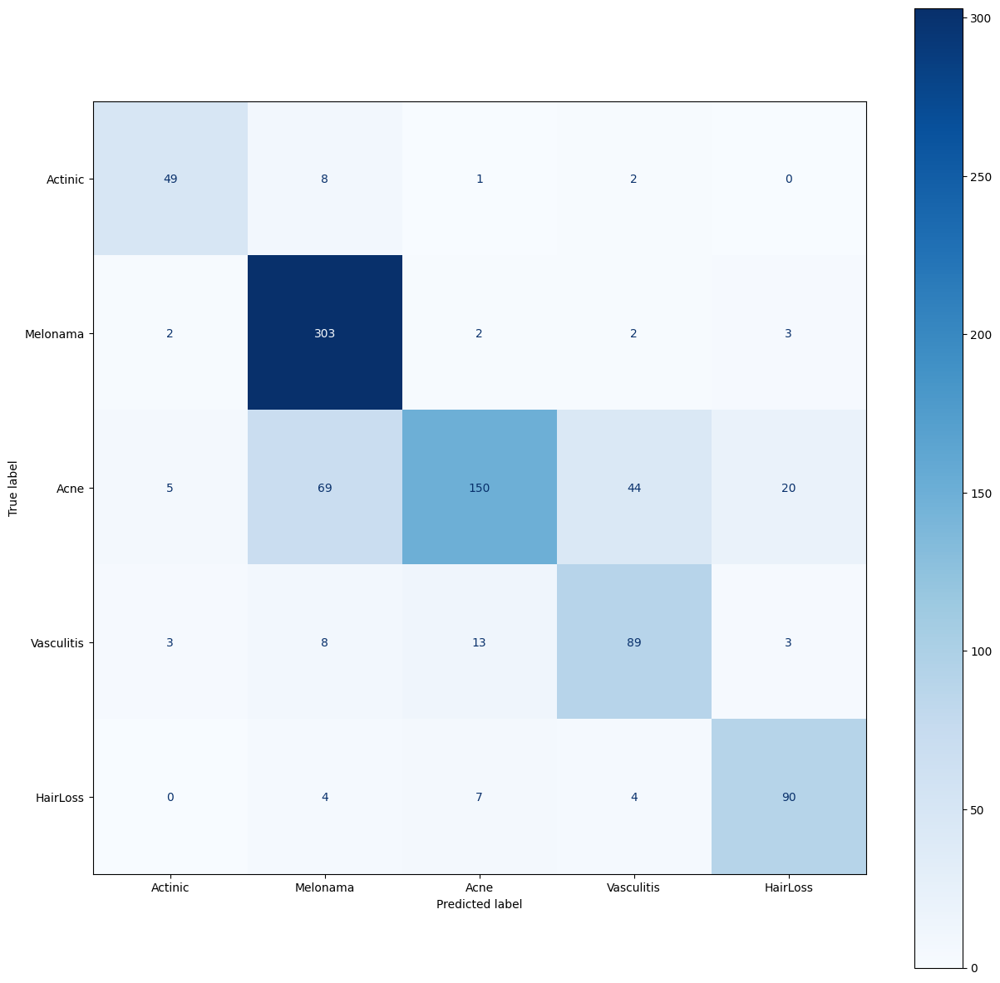

In [84]:
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Actinic','Melonama','Acne','Vasculitis','HairLoss'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

2- Model Accuracy

In [99]:
result = model.evaluate(test_generator,batch_size=10000)
print("test_loss, test accuracy",result)

881/881 [==============================] - 8s 9ms/step - loss: 0.7844 - categorical_accuracy: 0.7730
test_loss, test accuracy [0.7844434976577759, 0.7729852199554443]


In [100]:
xp_preds = model.predict(test_generator)
xp_pred_classes = np.argmax(xp_preds, axis=1)

881/881 [==============================] - 6s 7ms/step


In [101]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


xp_acc = accuracy_score(true_classes, xp_pred_classes)
print("Model Accuracy: {:.2f}%".format(xp_acc * 100))

Xception Model Accuracy: 87.30%


# ----------------------- Model Save --------------------------

In [102]:
from tensorflow.keras.models import load_model

In [103]:
model.save(os.path.join('models','Neww.h5'))

# ----------------------- Model Test --------------------------

Test ImageModel

In [49]:
ImageModel = load_model('models/New.h5')

In [50]:
historyy = ImageModel.history

881/881 [==============================] - 12s 7ms/step


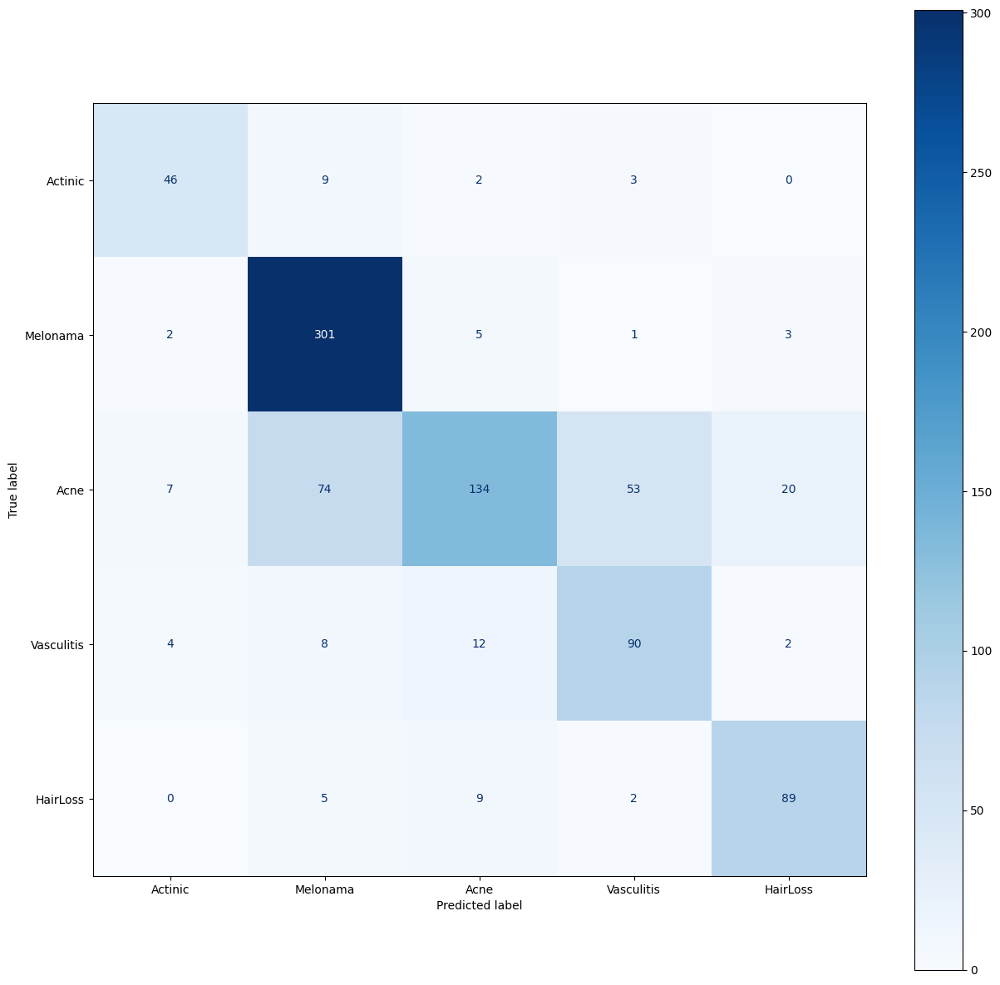

In [51]:
test_true=test_generator.classes
test_pred_raw = ImageModel.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Actinic','Melonama','Acne','Vasculitis','HairLoss'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

In [52]:
xp_preds = ImageModel.predict(test_generator)
xp_pred_classes = np.argmax(xp_preds, axis=1)
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


xp_acc = accuracy_score(true_classes, xp_pred_classes)
print("Xception Model Accuracy: {:.2f}%".format(xp_acc * 100))

881/881 [==============================] - 6s 7ms/step
Xception Model Accuracy: 74.91%


In [58]:
pip install ERAN

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement ERAN (from versions: none)
ERROR: No matching distribution found for ERAN


In [108]:
pip install --upgrade eran


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement eran (from versions: none)
ERROR: No matching distribution found for eran


In [112]:
import subprocess

subprocess.run(["python", ".", "--netname", "../nets/onnx/mnist/convBig__DiffAI.onnx", "--epsilon", "0.1", "--domain", "deepzono", "--dataset", "mnist"], capture_output=True, text=True)


CompletedProcess(args=['python', '.', '--netname', '../nets/onnx/mnist/convBig__DiffAI.onnx', '--epsilon', '0.1', '--domain', 'deepzono', '--dataset', 'mnist'], returncode=1, stdout='', stderr="C:\\Users\\azizo\\anaconda3\\envs\\tf\\python.exe: can't find '__main__' module in 'C:\\\\Users\\\\azizo\\\\Desktop\\\\3Ai2sem\\\\projetdl'\n")

In [121]:
!pip install -U tf2onnx



     ---------------------------------------- 0.0/451.2 kB ? eta -:--:--
     -- ------------------------------------ 30.7/451.2 kB 1.3 MB/s eta 0:00:01
     --------- ---------------------------- 112.6/451.2 kB 1.6 MB/s eta 0:00:01
     ------------------- ------------------ 235.5/451.2 kB 2.1 MB/s eta 0:00:01
     ------------------------------- ------ 368.6/451.2 kB 2.3 MB/s eta 0:00:01
     -------------------------------------- 451.2/451.2 kB 2.3 MB/s eta 0:00:00
  Using cached six-1.16.0-py2.py3-none-any.whl (11 kB)
  Using cached typing_extensions-4.5.0-py3-none-any.whl (27 kB)
  Using cached urllib3-1.26.15-py2.py3-none-any.whl (140 kB)
  Using cached idna-3.4-py3-none-any.whl (61 kB)
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.3.3
    Uninstalling flatbuffers-23.3.3:
      Successfully uninstalled flatbuffers-23.3.3


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.10.1 requires keras-preprocessing>=1.1.1, which is not installed.
jupyter-events 0.6.3 requires jsonschema[format-nongpl]>=3.2.0, which is not installed.
tensorflow 2.10.1 requires keras<2.11,>=2.10.0, but you have keras 2.12.0 which is incompatible.
tensorflow 2.10.1 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorflow 2.10.1 requires tensorboard<2.11,>=2.10, but you have tensorboard 2.12.0 which is incompatible.
tensorflow 2.10.1 requires tensorflow-estimator<2.11,>=2.10.0, but you have tensorflow-estimator 2.12.0 which is incompatible.


In [122]:
import keras2onnx
from keras.models import load_model
from keras.applications import VGG16

# Load the Keras model
model = load_model('models/New.h5')

# Convert the Keras model to ONNX format
onnx_model = keras2onnx.convert_keras(model, model.name)

# Save the ONNX model to disk
keras2onnx.save_model(onnx_model, 'path_to_save_onnx_model.onnx')



AttributeError: module 'tensorflow.python.keras' has no attribute 'applications'

Class Prediction Array

In [47]:
img = tf.keras.utils.load_img(
    'C:/Users/azizo/Desktop/a/test/Hair Loss Photos Alopecia and other Hair Diseases/telogen-effluvium-5.jpg',
    target_size=(224, 224)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = ImageModel.predict(img_array/224) #To split

predictions  #Prediction % for eacr diseas

1/1 [==============================] - 1s 700ms/step


array([[9.9797314e-01, 1.1421915e-03, 2.3033735e-04, 6.3845393e-04,
        1.5876220e-05]], dtype=float32)

Disease Prediction

In [53]:
Normal = ["hairloss", "acne and rosacea", "melanoma skin cancer nevi and moles"]
Dangerous = ["actinic keratosis basal cell carcinoma", "vasculties"]

In [58]:
score = tf.nn.softmax(predictions[0])

#class_names = list(train_generator.class_indices)
# train_generator.class_indices = {'HairLoss': 0, 'acne': 1, 'actinic': 2, 'melonama': 3, 'vasculitis': 4}
#Let's create a name list

namesDiseases = ["HairLoss", "Acne and Rosacea", "Actinic Keratosis Basal Cell Carcinoma", "Melanoma Skin Cancer Nevi and Moles","Vasculties"]
#Choose the most approch disease
print(
    "This image most likely belongs to '''{}''' with a {:.2f} percent confidence."
    .format(namesDiseases[np.argmax(score)], 100 * np.max(score) + 50)
)

#Search for disease
search_str = namesDiseases[np.argmax(score)].lower()
if search_str in Dangerous:
    print("-> It's a dangerous disease , You need to see a doctor")
elif search_str in Normal:
    print("-> It is not a serious disease, you can take your time")

This image most likely belongs to '''HairLoss''' with a 90.40 percent confidence.
-> It is not a serious disease, you can take your time


# Django User

In [59]:
from keras.preprocessing import image
def predict_image(imagepath):

    img = tf.keras.utils.load_img(
    imagepath,
    target_size=(224, 224)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = ImageModel.predict(img_array/255) #To split

    score = tf.nn.softmax(predictions[0])

    namesDiseases = ["HairLoss", "Acne and Rosacea", "Actinic Keratosis Basal Cell Carcinoma", "Melanoma Skin Cancer Nevi and Moles","Vasculties"]

    
    print(
    "This image most likely belongs to '''{}''' with a {:.2f} percent confidence."
    .format(namesDiseases[np.argmax(score)], 100 * np.max(score) + 50)
    )
     
    
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(15, 15))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.05)
    ax = grid[0]
    img = tf.keras.utils.load_img(imagepath)
    img_array = tf.keras.utils.img_to_array(img)
    ax.imshow(img)
    
    
    ax.text(10, 150, 'Disease Name: %s' % namesDiseases[np.argmax(score)].upper(), color='k', backgroundcolor='w',\
    alpha=0.8, size = 20)
    
    
    search_str = namesDiseases[np.argmax(score)].lower()
    print(search_str)
    if search_str in Normal:
        ax.text(10, 200, 'It is not a serious disease, you can take your time', color='g', backgroundcolor='w',\
        alpha=0.8, size = 20)
    elif search_str in Dangerous:
        ax.text(10, 200, 'You need to see a doctor', color='g', backgroundcolor='w',\
        alpha=0.8, size = 20)
    
    
    
    ax.axis('off')
    plt.show()

1/1 [==============================] - 0s 21ms/step
This image most likely belongs to '''HairLoss''' with a 90.39 percent confidence.
hairloss


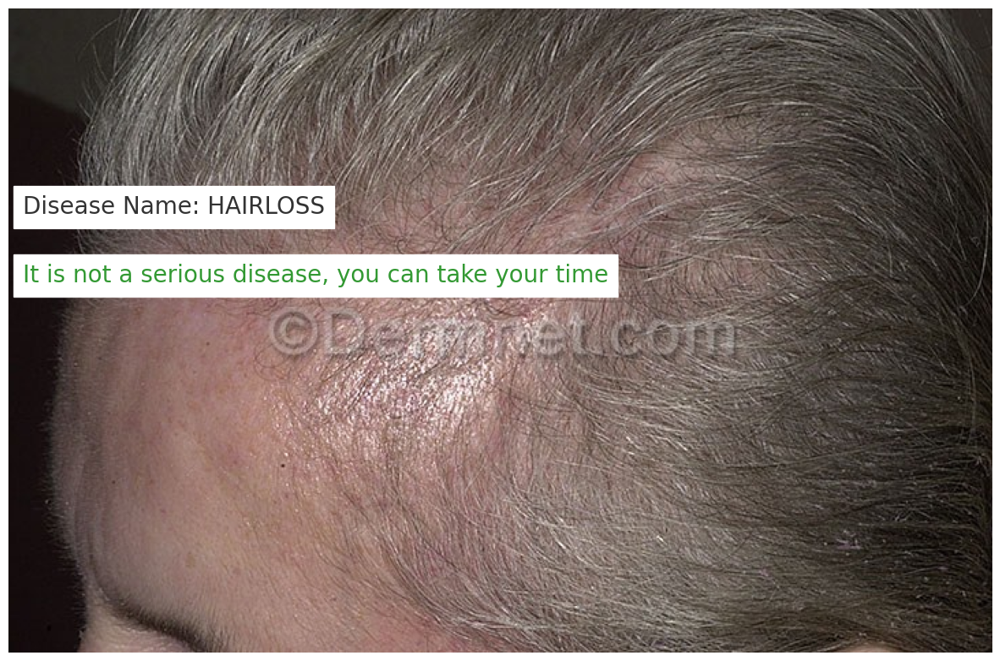

In [61]:
predict_image('C:/Users/azizo/Desktop/a/test/Hair Loss Photos Alopecia and other Hair Diseases/telogen-effluvium-5.jpg')

1/1 [==============================] - 0s 22ms/step
This image most likely belongs to '''Vasculties''' with a 80.87 percent confidence.
vasculties


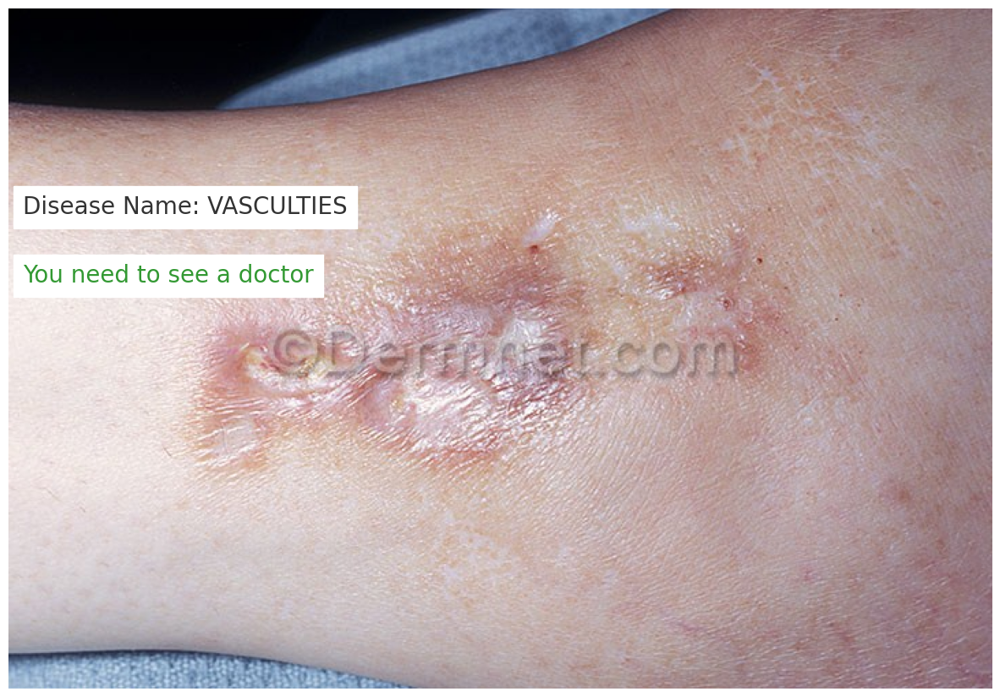

In [63]:
predict_image('C:/Users/azizo/Desktop/a/test/Vasculitis Photos/atrophy-blanche-4.jpg')

1/1 [==============================] - 0s 22ms/step
This image most likely belongs to '''Melanoma Skin Cancer Nevi and Moles''' with a 90.46 percent confidence.
melanoma skin cancer nevi and moles


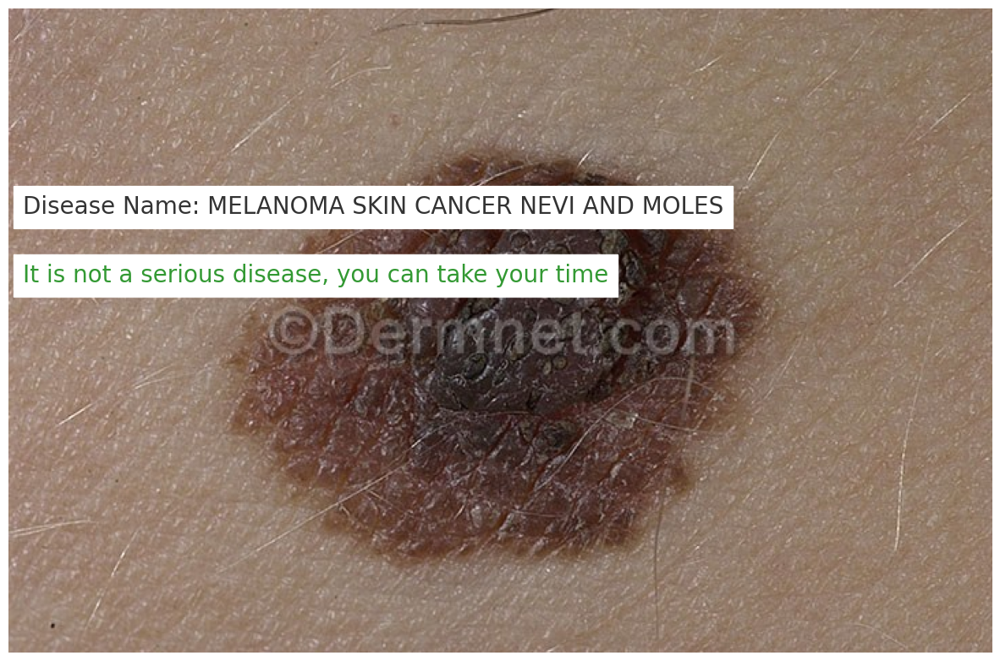

In [64]:
predict_image('C:/Users/azizo/Desktop/a/test/Melanoma Skin Cancer Nevi and Moles/atypical-nevi-23.jpg')

1/1 [==============================] - 0s 21ms/step
This image most likely belongs to '''Actinic Keratosis Basal Cell Carcinoma''' with a 89.21 percent confidence.
actinic keratosis basal cell carcinoma


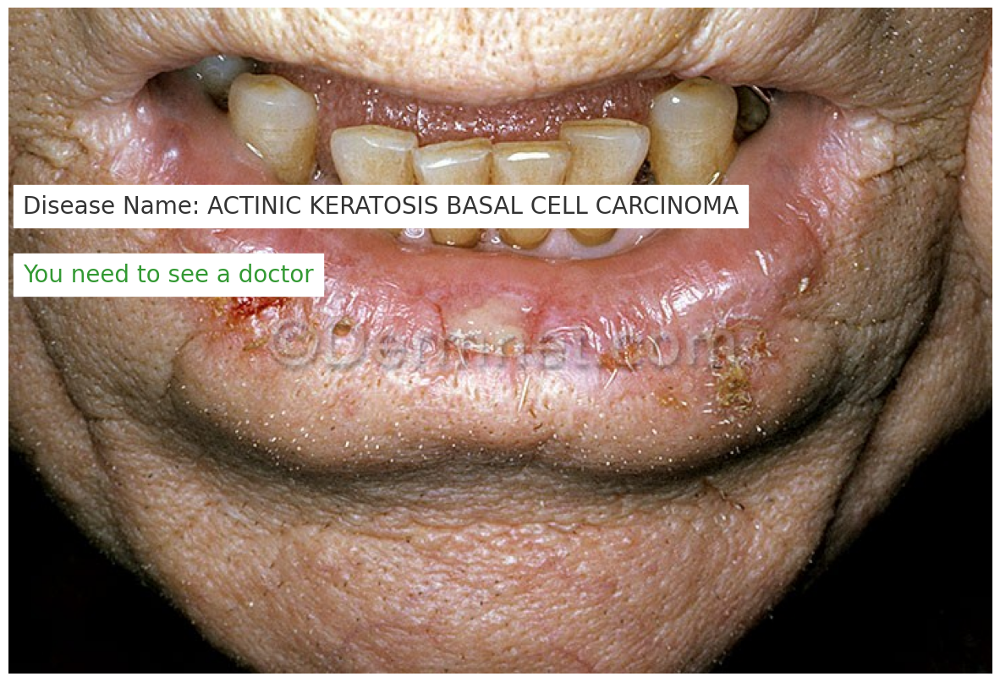

In [66]:
predict_image('C:/Users/azizo/Desktop/a/test/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions/actinic-cheilitis-sq-cell-lip-9.jpg')

1/1 [==============================] - 0s 22ms/step
This image most likely belongs to '''Vasculties''' with a 90.41 percent confidence.
vasculties


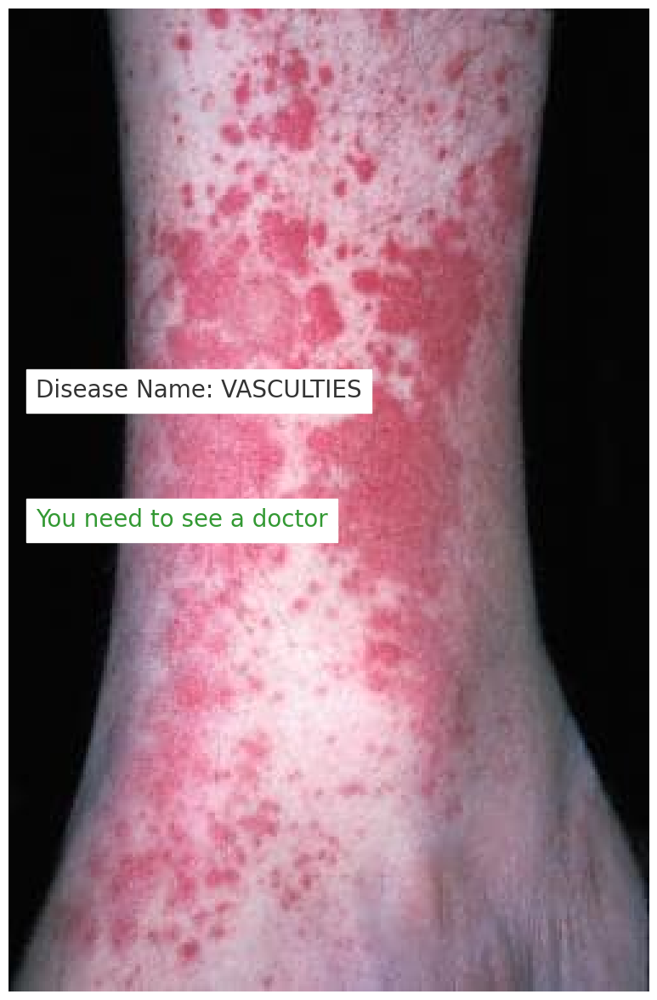

In [69]:
predict_image('C:/Users/azizo/Downloads/28385tn.jpg')

# Bla bla

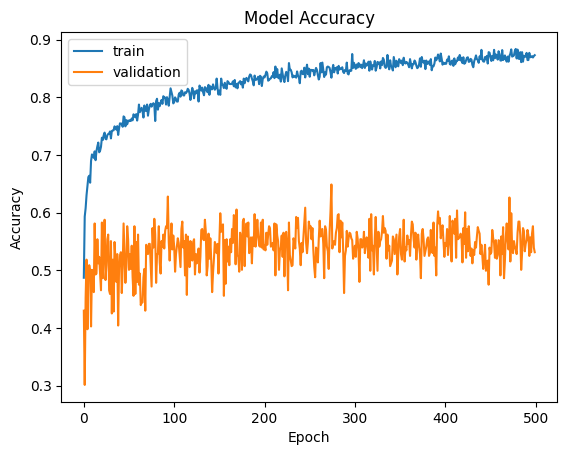

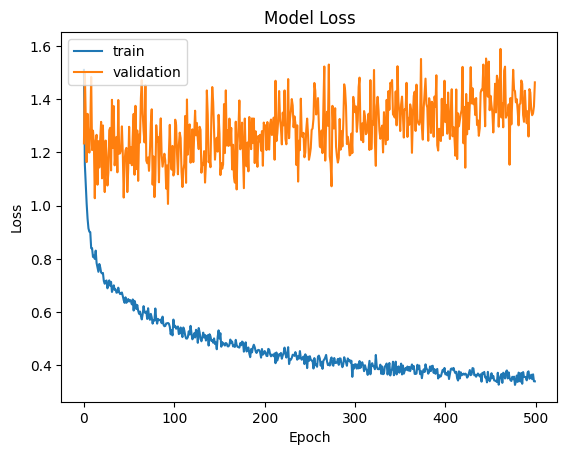

In [42]:
import matplotlib.pyplot as plt

# plot the training and validation accuracy curves
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# plot the training and validation loss curves
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

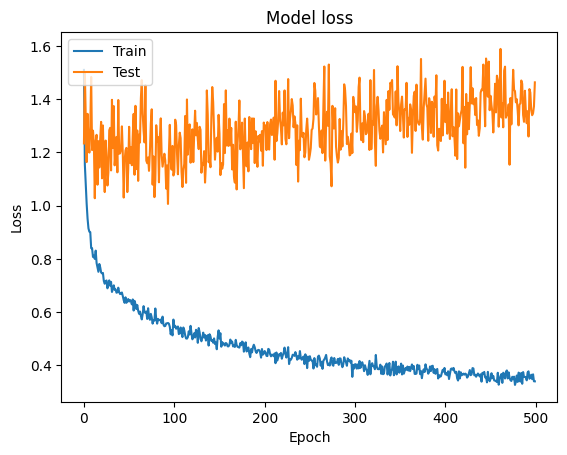

In [43]:
# Plot loss values vs epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

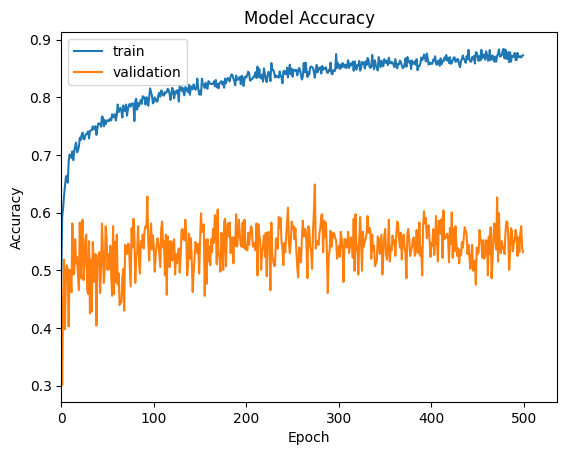

In [44]:
import matplotlib.pyplot as plt

plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.xlim([0, 536])  # Set the x-axis limits to show up to 500 epochs
plt.show()
